In [1]:
# https://www.kaggle.com/josephassaker/coleridge-initiative-eda-na-ve-submission
# 1. Setup and Basic EDA

In [2]:
"""
import os
import re
import json
import glob
from collections import defaultdict

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go

%matplotlib inline

os.listdir('/kaggle/input/coleridgeinitiative-show-us-the-data')
"""

"\nimport os\nimport re\nimport json\nimport glob\nfrom collections import defaultdict\n\nimport numpy as np\nimport pandas as pd\n\nimport matplotlib.pyplot as plt\nimport plotly.express as px\nimport plotly.graph_objects as go\n\n%matplotlib inline\n\nos.listdir('/kaggle/input/coleridgeinitiative-show-us-the-data')\n"

In [3]:
import os
import re    #正規表現の処理を行うには標準ライブラリ
import json
import glob   #引数に指定されたパターンにマッチするファイルパス名を取得
from collections import defaultdict    #dict の初期化を関数にしたがって実施する事ができます

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

# plotly: インタラクティブなグラフを作成
import plotly.express as px    #https://qiita.com/prs-watch/items/73e3d8ac81d843889d4c
import plotly.graph_objects as go
from wordcloud import WordCloud, STOPWORDS   #単語が使用頻度に応じた大きさでゴチャゴチャっと表示され

%matplotlib inline

DATA_PATH = 'C:\\Users\\shota\\OneDrive\\ドキュメント\\Data\\Kaggle\\kc_Coleridge_Initiative-ShowUS_theData\\'

os.listdir(DATA_PATH)

['sample_submission.csv', 'test', 'train', 'train.csv']

In [4]:
train = pd.read_csv(DATA_PATH + 'train.csv')
train

,Id,pub_title,dataset_title,dataset_label,cleaned_label
0,d0fa7568-7d8e-4db9-870f-f9c6f668c17b,The Impact of Dual Enrollment on College Degre...,National Education Longitudinal Study,National Education Longitudinal Study,national education longitudinal study
1,2f26f645-3dec-485d-b68d-f013c9e05e60,Educational Attainment of High School Dropouts...,National Education Longitudinal Study,National Education Longitudinal Study,national education longitudinal study
2,c5d5cd2c-59de-4f29-bbb1-6a88c7b52f29,Differences in Outcomes for Female and Male St...,National Education Longitudinal Study,National Education Longitudinal Study,national education longitudinal study
3,5c9a3bc9-41ba-4574-ad71-e25c1442c8af,Stepping Stone and Option Value in a Model of ...,National Education Longitudinal Study,National Education Longitudinal Study,national education longitudinal study
4,c754dec7-c5a3-4337-9892-c02158475064,"Parental Effort, School Resources, and Student...",National Education Longitudinal Study,National Education Longitudinal Study,national education longitudinal study
...,...,...,...,...,...
19656,b3498176-8832-4033-aea6-b5ea85ea04c4,RSNA International Trends: A Global Perspectiv...,RSNA International COVID-19 Open Radiology Dat...,RSNA International COVID Open Radiology Database,rsna international covid open radiology database
19657,f77eb51f-c3ac-420b-9586-cb187849c321,MCCS: a novel recognition pattern-based method...,CAS COVID-19 antiviral candidate compounds dat...,CAS COVID-19 antiviral candidate compounds dat...,cas covid 19 antiviral candidate compounds dat...
19658,ab59bcdd-7b7c-4107-93f5-0ccaf749236c,Quantitative Structure–Activity Relationship M...,CAS COVID-19 antiviral candidate compounds dat...,CAS COVID-19 antiviral candidate compounds dat...,cas covid 19 antiviral candidate compounds dat...
19659,fd23e7e0-a5d2-4f98-992d-9209c85153bb,A ligand-based computational drug repurposing ...,CAS COVID-19 antiviral candidate compounds dat...,CAS COVID-19 antiviral candidate compounds dat...,cas covid 19 antiviral candidate compounds dat...


In [5]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19661 entries, 0 to 19660
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Id             19661 non-null  object
 1   pub_title      19661 non-null  object
 2   dataset_title  19661 non-null  object
 3   dataset_label  19661 non-null  object
 4   cleaned_label  19661 non-null  object
dtypes: object(5)
memory usage: 768.1+ KB


In [6]:
"""
for col in train.columns:
    print(f"{col}: {len(train[col].unique())}")
"""

'\nfor col in train.columns:\n    print(f"{col}: {len(train[col].unique())}")\n'

In [7]:
for col in train.columns:
    print(f"{col}: {len(train[col].unique())}")

Id: 14316
pub_title: 14271
dataset_title: 45
dataset_label: 130
cleaned_label: 130


In [8]:
# 1.1. Dataset Title VS Dataset Label

In [9]:
"""
print("Printing below the dataset titles that have multiple dataset labels associated with them:\n")
datasets_titles_unique = train["dataset_title"].unique()
for dataset_title in datasets_titles_unique:
    if len(train[train["dataset_title"] == dataset_title]["dataset_label"].unique()) > 1:
        print(f"'{dataset_title}':", list(train[train["dataset_title"] == dataset_title]["dataset_label"].unique()), "\n")
"""

'\nprint("Printing below the dataset titles that have multiple dataset labels associated with them:\n")\ndatasets_titles_unique = train["dataset_title"].unique()\nfor dataset_title in datasets_titles_unique:\n    if len(train[train["dataset_title"] == dataset_title]["dataset_label"].unique()) > 1:\n        print(f"\'{dataset_title}\':", list(train[train["dataset_title"] == dataset_title]["dataset_label"].unique()), "\n")\n'

In [10]:
datasets_titles_unique = train['dataset_title'].unique()
for dataset_title in datasets_titles_unique:
    if len(train[train["dataset_title"] == dataset_title]["dataset_label"].unique()) > 1:
        print(f"'{dataset_title}':", list(train[train["dataset_title"] == dataset_title]["dataset_label"].unique()), "\n")

'NOAA Tide Gauge': ['NOAA tidal station', 'NOAA National Water Level Observation Network', 'NOAA water level station', 'National Water Level Observation Network', 'NOAA Tide Gauge', 'NOAA tide station'] 

'Sea, Lake, and Overland Surges from Hurricanes': ['SLOSH model', 'NOAA Sea, Lake, and Overland Surges from Hurricanes', 'NOAA storm surge inundation', 'National Weather Service (NWS) storm surge risk'] 

'Coastal Change Analysis Program': ['NOAA C-CAP', 'National Oceanic and Atmospheric Administration C-CAP', 'Coastal Change Analysis Program', 'Coastal Change Analysis Program land cover'] 

'Aging Integrated Database (AGID)': ['Aging Integrated Database (AGID)', 'Aging Integrated Database'] 

'Alzheimer's Disease Neuroimaging Initiative (ADNI)': ['Alzheimers Disease Neuroimaging Initiative', 'ADNI', "Alzheimer's Disease Neuroimaging Initiative (ADNI)"] 

'Baltimore Longitudinal Study of Aging (BLSA)': ['Baltimore Longitudinal Study of Aging (BLSA)', 'Baltimore Longitudinal Study of A

In [11]:
# 1.2. Datasets Popularity

In [12]:
"""
dataset_titles_counts = train['dataset_title'].value_counts()

fig = go.Figure(data=[go.Table(
  columnwidth = [0.25, 2, 0.5],
  header=dict(
    values=["<b>Rank</b>", "<b>Dataset Title</b>", "<b>Mentions</b>"],
    line_color='darkslategray',
    fill_color="royalblue",
    align='center',
    font=dict(color='white', size=12)
  ),
  cells=dict(
    values=np.array([np.array((str(i+1), "<i>" + x + "</i>", "<b>" + str(y) + "</b>", )) for i, (x, y) in enumerate(zip(dataset_titles_counts.index, dataset_titles_counts.values))]).T,
    line_color='darkslategray',
    # 2-D list of colors for alternating rows
    fill_color = [["white","lavender"]*25],
    align = 'center',
    font = dict(color = 'darkslategray', size = 11)
    ))
])

fig.update_layout(
    title={"text": "<b>Datasets Titles Mentions Counts</b>",
           "x": 0.5,
           "xanchor":"center",
           "font_size": 22},
    margin={"r":20, "l":20})

fig.show()
"""

'\ndataset_titles_counts = train[\'dataset_title\'].value_counts()\n\nfig = go.Figure(data=[go.Table(\n  columnwidth = [0.25, 2, 0.5],\n  header=dict(\n    values=["<b>Rank</b>", "<b>Dataset Title</b>", "<b>Mentions</b>"],\n    line_color=\'darkslategray\',\n    fill_color="royalblue",\n    align=\'center\',\n    font=dict(color=\'white\', size=12)\n  ),\n  cells=dict(\n    values=np.array([np.array((str(i+1), "<i>" + x + "</i>", "<b>" + str(y) + "</b>", )) for i, (x, y) in enumerate(zip(dataset_titles_counts.index, dataset_titles_counts.values))]).T,\n    line_color=\'darkslategray\',\n    # 2-D list of colors for alternating rows\n    fill_color = [["white","lavender"]*25],\n    align = \'center\',\n    font = dict(color = \'darkslategray\', size = 11)\n    ))\n])\n\nfig.update_layout(\n    title={"text": "<b>Datasets Titles Mentions Counts</b>",\n           "x": 0.5,\n           "xanchor":"center",\n           "font_size": 22},\n    margin={"r":20, "l":20})\n\nfig.show()\n'

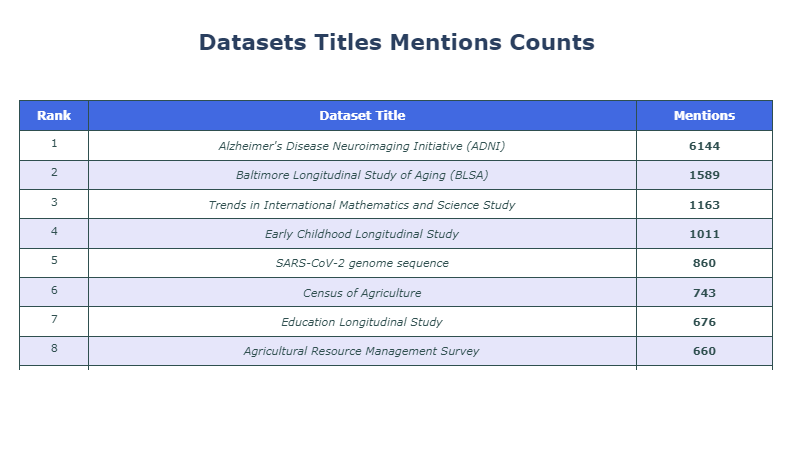

In [13]:
dataset_titles_counts = train['dataset_title'].value_counts()   #value_counts:値ごとの出現回数を数える

fig = go.Figure(data=[go.Table(
  columnwidth = [0.25, 2, 0.5],
  header=dict(
    values=["<b>Rank</b>", "<b>Dataset Title<b>", "<b>Mentions</b>"],
    line_color='darkslategray',
    fill_color='royalblue',
    align = 'center',
    font=dict(color='white', size=12)
  ),
  cells=dict(
    values=np.array([np.array((str(i+1), "<i>" + x + "</i>", "<b>" + str(y) + "</b>", )) for i, (x, y) in enumerate(zip(dataset_titles_counts.index, dataset_titles_counts.values))]).T, 
    line_color='darkslategray',                                                                          #enumerateを使ったfor文: インデックス番号, 要素を表示  
    # 2-D list of colors for alternating rows
    fill_color = [["white","lavender"]*25],
    align = 'center',
    font = dict(color = 'darkslategray', size = 11)
    ))
])

fig.update_layout(
    title={"text": "<b>Datasets Titles Mentions Counts</b>",
           "x": 0.5,
           "xanchor":"center",
           "font_size": 22},
    margin={"r":20, "l":20})

fig.show()

In [14]:
dataset_titles_counts.index

Index(['Alzheimer's Disease Neuroimaging Initiative (ADNI)',
       'Baltimore Longitudinal Study of Aging (BLSA)',
       'Trends in International Mathematics and Science Study',
       'Early Childhood Longitudinal Study', 'SARS-CoV-2 genome sequence',
       'Census of Agriculture', 'Education Longitudinal Study',
       'Agricultural Resource Management Survey',
       'North American Breeding Bird Survey (BBS)',
       'National Education Longitudinal Study', 'Survey of Earned Doctorates',
       'Rural-Urban Continuum Codes', 'Beginning Postsecondary Student',
       'NOAA Tide Gauge',
       'International Best Track Archive for Climate Stewardship',
       'Common Core of Data', 'World Ocean Database',
       'Coastal Change Analysis Program',
       'Sea, Lake, and Overland Surges from Hurricanes',
       'Survey of Doctorate Recipients', 'Baccalaureate and Beyond',
       'Optimum Interpolation Sea Surface Temperature',
       'Our World in Data COVID-19 dataset',
       'COV

In [15]:
# 1.3. Datasets Occurence Together

In [16]:
"""
multi_mentions = [] # list of tuples (Id, num_unique_mentions) 

for Id in train.Id.unique():
    num_unique_mentions = len(train[train['Id'] == Id]['dataset_title'].unique())
    if num_unique_mentions > 1:
        multi_mentions.append((Id, num_unique_mentions))

print(f"There are {len(multi_mentions)} publications in the training set that mention more than 1 dataset. That is {len(multi_mentions) / len(train.Id.unique()) * 100:.2f}% of the publications.")
"""

'\nmulti_mentions = [] # list of tuples (Id, num_unique_mentions) \n\nfor Id in train.Id.unique():\n    num_unique_mentions = len(train[train[\'Id\'] == Id][\'dataset_title\'].unique())\n    if num_unique_mentions > 1:\n        multi_mentions.append((Id, num_unique_mentions))\n\nprint(f"There are {len(multi_mentions)} publications in the training set that mention more than 1 dataset. That is {len(multi_mentions) / len(train.Id.unique()) * 100:.2f}% of the publications.")\n'

In [17]:
multi_mentions = []

for Id in train.Id.unique():
    num_unique_mentions = len(train[train['Id'] == Id]['dataset_title'].unique())
    if num_unique_mentions > 1:
        multi_mentions.append((Id, num_unique_mentions))
        
print(f"There are {len(multi_mentions)} publications in the training set that mention more than 1 dataset. That is {len(multi_mentions) / len(train.Id.unique()) * 100:.2f}% of the publications.")

There are 965 publications in the training set that mention more than 1 dataset. That is 6.74% of the publications.


In [18]:
multi_mentions

[('d0fa7568-7d8e-4db9-870f-f9c6f668c17b', 2),
 ('2f26f645-3dec-485d-b68d-f013c9e05e60', 2),
 ('c5d5cd2c-59de-4f29-bbb1-6a88c7b52f29', 2),
 ('5c9a3bc9-41ba-4574-ad71-e25c1442c8af', 2),
 ('c754dec7-c5a3-4337-9892-c02158475064', 2),
 ('81b5f874-9b42-4d4f-8c50-b4bab24f8aed', 2),
 ('f35fdfa6-a3f9-4ef3-a858-c8e2efcd2349', 2),
 ('1b21f60a-4022-4b19-95ce-6fd7157d4aa9', 2),
 ('e5a4c6af-0854-4f7e-b088-06f03c18a01a', 3),
 ('4e18b1c7-e195-46e2-af0f-78757259f0c6', 2),
 ('e27b58cf-5453-4493-8ec4-f7cd892e8624', 2),
 ('630de001-fa5b-4973-ba3f-52f6f1f4dc2d', 4),
 ('d5ff0ecd-ccf5-4f8a-a09c-182376eed4d0', 2),
 ('e977a870-0067-4221-8423-5ff349510222', 2),
 ('7a2d20d9-fe83-4d24-b4ce-992f92f21bd2', 2),
 ('65731d69-af28-47af-8d29-a72b4a430e37', 2),
 ('a8c7306f-908c-4d44-92b1-2afb2e066808', 2),
 ('2f9d8444-9034-4ecb-a836-b1c473b9c457', 2),
 ('f5cffcf3-bcc6-4ab0-8203-851a17df96bf', 2),
 ('a3c998b6-ea9d-4542-9267-68f718247ff5', 3),
 ('1b282315-96f9-469b-b417-be0f46e4db0a', 2),
 ('0ebdaf88-543a-4d88-9185-a24f8dc

In [19]:
"""
co_mentions = defaultdict(int)

for Id, num_mentions in multi_mentions:
    co_mentions[tuple(sorted(train[train['Id'] == Id]["dataset_title"].unique()))] += 1

print(f"There are {len(co_mentions)} unique sets of co-occurences of dataset mentions.")
"""

'\nco_mentions = defaultdict(int)\n\nfor Id, num_mentions in multi_mentions:\n    co_mentions[tuple(sorted(train[train[\'Id\'] == Id]["dataset_title"].unique()))] += 1\n\nprint(f"There are {len(co_mentions)} unique sets of co-occurences of dataset mentions.")\n'

In [20]:
co_mentions = defaultdict(int)

for Id, num_mentions in multi_mentions:
    co_mentions[tuple(sorted(train[train['Id'] == Id]["dataset_title"].unique()))] += 1   #sorted():ソートされたリストを返す。元のリストは変更されない非破壊的処理。
    
print(f"There are {len(co_mentions)} unique sets of co-occurences of dataset mentions.")

There are 113 unique sets of co-occurences of dataset mentions.


In [21]:
# defaultdict():使い方
"""
例
from collections import defaultdict
>> d = defaultdict(int)
>> animals = ['dog', 'cat', 'lion', 'dog', 'cat']
>> for i in animals:
           d[i]　+=　1
>> d['rat']=5
>> dict(d)

結果　　{'dog': 2, 'cat': 2, 'lion': 1, 'rat': 5}
"""

"\n例\nfrom collections import defaultdict\n>> d = defaultdict(int)\n>> animals = ['dog', 'cat', 'lion', 'dog', 'cat']\n>> for i in animals:\n           d[i]\u3000+=\u30001\n>> d['rat']=5\n>> dict(d)\n\n結果\u3000\u3000{'dog': 2, 'cat': 2, 'lion': 1, 'rat': 5}\n"

In [22]:
co_mentions   #Idは違うが、同じデータセットを持つものとその数

defaultdict(int,
            {('Education Longitudinal Study',
              'National Education Longitudinal Study'): 411,
             ('Early Childhood Longitudinal Study',
              'Education Longitudinal Study',
              'National Education Longitudinal Study'): 29,
             ('Baccalaureate and Beyond',
              'Beginning Postsecondary Student',
              'Education Longitudinal Study',
              'National Education Longitudinal Study'): 13,
             ('Beginning Postsecondary Student',
              'Education Longitudinal Study',
              'National Education Longitudinal Study'): 29,
             ('Education Longitudinal Study',
              'National Education Longitudinal Study',
              'Trends in International Mathematics and Science Study'): 9,
             ('Early Childhood Longitudinal Study',
              'Education Longitudinal Study',
              'National Education Longitudinal Study',
              'Trends in Internationa

In [23]:
"""
co_mentions = dict(sorted(co_mentions.items(), key=lambda item: item[1], reverse=True))

fig = go.Figure(data=[go.Table(
  columnwidth = [0.25, 2, 0.5],
  header=dict(
    values=["<b>Rank</b>", "<b>Datasets Co-Mentions Sets</b>", "<b>Occurences</b>"],
    line_color='darkslategray',
    fill_color="royalblue",
    align='center',
    font=dict(color='white', size=12)
  ),
  cells=dict(
    values=np.array([np.array((str(i+1), "<i>" + str(k) + "</i>", "<b>" + str(v) + "</b>", )) for i, (k, v) in enumerate(co_mentions.items())]).T,
    line_color='darkslategray',
    fill_color = [["white","lavender"]*60],
    align = 'center',
    font = dict(color = 'darkslategray', size = 11)
    ))
])

fig.update_layout(
    title={"text": "<b>Datasets Mentioned in the same Publications</b>",
           "x": 0.5,
           "xanchor":"center",
           "font_size": 22},
    margin={"r":20, "l":20})

fig.show()
"""

'\nco_mentions = dict(sorted(co_mentions.items(), key=lambda item: item[1], reverse=True))\n\nfig = go.Figure(data=[go.Table(\n  columnwidth = [0.25, 2, 0.5],\n  header=dict(\n    values=["<b>Rank</b>", "<b>Datasets Co-Mentions Sets</b>", "<b>Occurences</b>"],\n    line_color=\'darkslategray\',\n    fill_color="royalblue",\n    align=\'center\',\n    font=dict(color=\'white\', size=12)\n  ),\n  cells=dict(\n    values=np.array([np.array((str(i+1), "<i>" + str(k) + "</i>", "<b>" + str(v) + "</b>", )) for i, (k, v) in enumerate(co_mentions.items())]).T,\n    line_color=\'darkslategray\',\n    fill_color = [["white","lavender"]*60],\n    align = \'center\',\n    font = dict(color = \'darkslategray\', size = 11)\n    ))\n])\n\nfig.update_layout(\n    title={"text": "<b>Datasets Mentioned in the same Publications</b>",\n           "x": 0.5,\n           "xanchor":"center",\n           "font_size": 22},\n    margin={"r":20, "l":20})\n\nfig.show()\n'

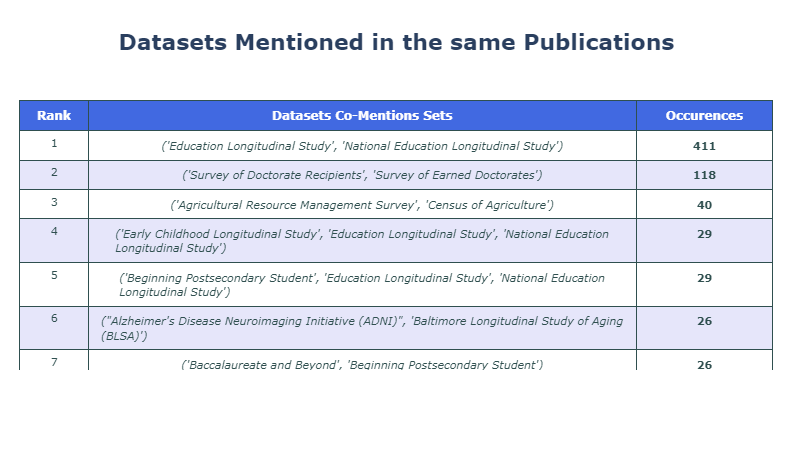

In [24]:
co_mentions = dict(sorted(co_mentions.items(), key=lambda item: item[1], reverse=True))  #sorted(reverse=True):降順にする

fig = go.Figure(data=[go.Table(
  columnwidth = [0.25, 2, 0.5],
  header=dict(
    values=["<b>Rank</b>", "<b>Datasets Co-Mentions Sets</b>", "<b>Occurences</b>"],
    line_color='darkslategray',
    fill_color='royalblue',
    align='center',
    font=dict(color='white', size=12)
  ),
  cells=dict(
    values=np.array([np.array((str(i+1), "<i>" + str(k) + "</i>", "<b>" + str(v) + "</b>", )) for i, (k, v) in enumerate(co_mentions.items())]).T,
    line_color='darkslategray',
    fill_color = [["white","lavender"]*60],
    align = 'center',
    font = dict(color = 'darkslategray', size=11)
    ))
])

fig.update_layout(
    title={"text": "<b>Datasets Mentioned in the same Publications</b>",
           "x": 0.5,
           "xanchor":"center",
           "font_size": 22},
    margin={"r":20, "l":20})

fig.show()

In [25]:
# 2. Wordcloud of the Articles Titles

In [26]:
"""
from wordcloud import WordCloud, STOPWORDS

words_in_titles = list(train.pub_title.str.split(expand=True).stack())

wordcloud = WordCloud(stopwords = STOPWORDS,
                      background_color = "white",
                      width = 3000,
                      height = 2000
                     ).generate(' '.join(words_in_titles))
plt.figure(1, figsize = (18, 12))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()
"""

'\nfrom wordcloud import WordCloud, STOPWORDS\n\nwords_in_titles = list(train.pub_title.str.split(expand=True).stack())\n\nwordcloud = WordCloud(stopwords = STOPWORDS,\n                      background_color = "white",\n                      width = 3000,\n                      height = 2000\n                     ).generate(\' \'.join(words_in_titles))\nplt.figure(1, figsize = (18, 12))\nplt.imshow(wordcloud)\nplt.axis(\'off\')\nplt.show()\n'

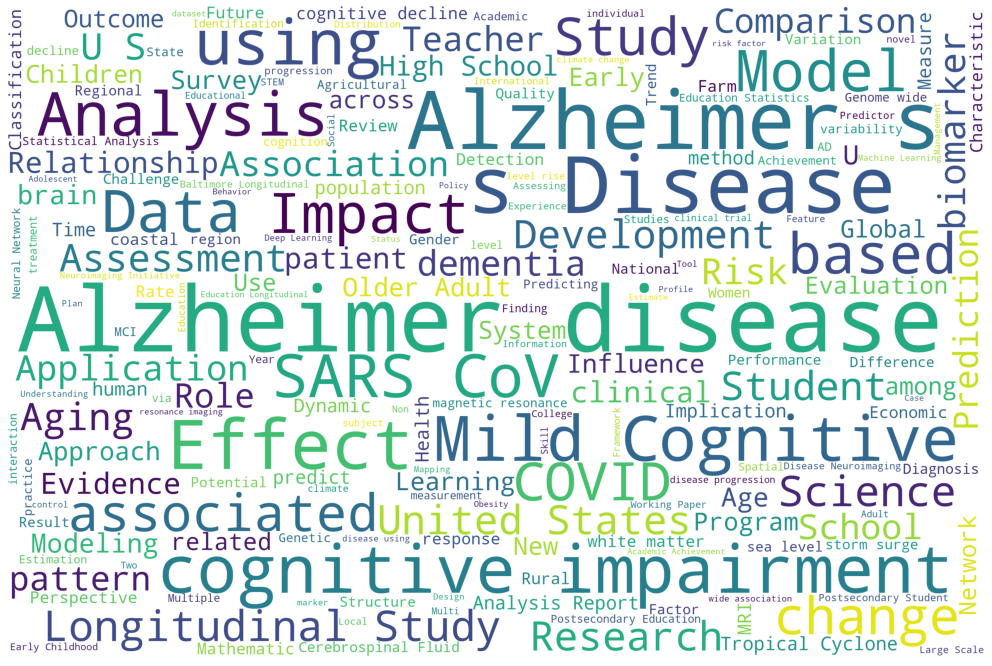

In [27]:
from wordcloud import WordCloud, STOPWORDS     #単語が使用頻度に応じた大きさでゴチャゴチャっと表示される

words_in_titles = list(train.pub_title.str.split(expand=True).stack())  #複数の列に分割してpandas.DataFrameとして取得するには、引数expand=Trueを指定
                                                              # 列から行へピボット: stack()
wordcloud = WordCloud(stopwords = STOPWORDS,
                      background_color = "white",
                      width = 3000,
                      height = 2000
                     ).generate(' '.join(words_in_titles))
plt.figure(1, figsize = (18, 12))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

In [ ]:
# 2.1. Wordclouds of Article Titles by Dataset Mentions

In [ ]:
"""
words_in_titles_by_dataset = defaultdict(list)

# Separating out positive and negative words (i.e., words appearing in negative and positive tweets),
# in order to visualize each set of words independently
for _, row in train.iterrows():
    words_in_titles_by_dataset[row['dataset_title']].extend(row['pub_title'].split())

# Defining our word cloud drawing function
def wordcloud_draw(data, color = 'white'):
    wordcloud = WordCloud(stopwords = STOPWORDS,
                          background_color = color,
                          width = 3000,
                          height = 2000
                         ).generate(' '.join(data))
    plt.figure(1, figsize = (12, 8))
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.show()

for dataset_title in train['dataset_title'].unique():
    print("Wordcloud for publications mentioning", dataset_title, ":")
    wordcloud_draw(words_in_titles_by_dataset[dataset_title])
"""

Wordcloud for publications mentioning National Education Longitudinal Study :


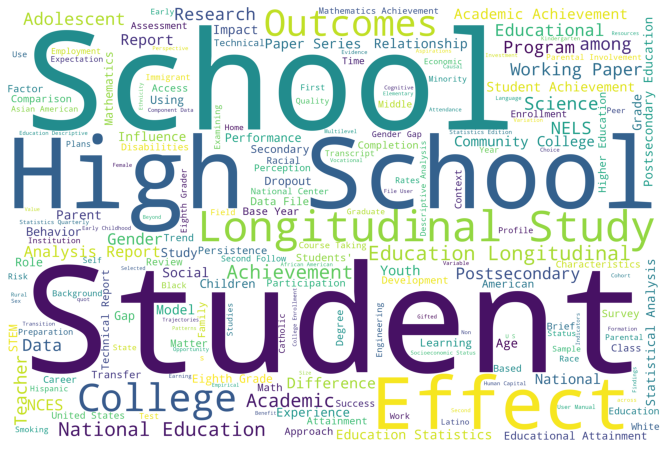

Wordcloud for publications mentioning NOAA Tide Gauge :


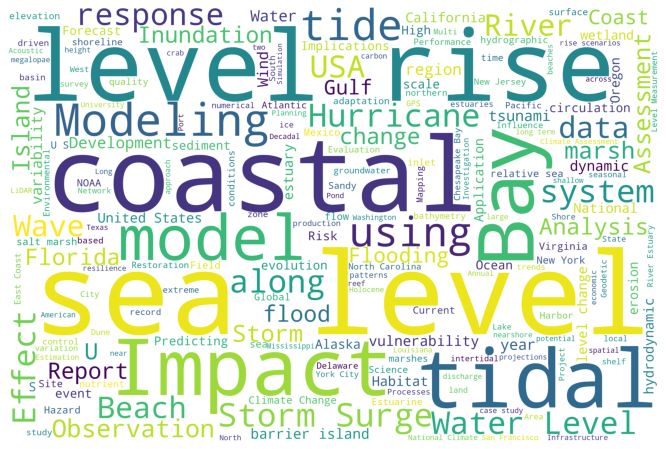

Wordcloud for publications mentioning Sea, Lake, and Overland Surges from Hurricanes :


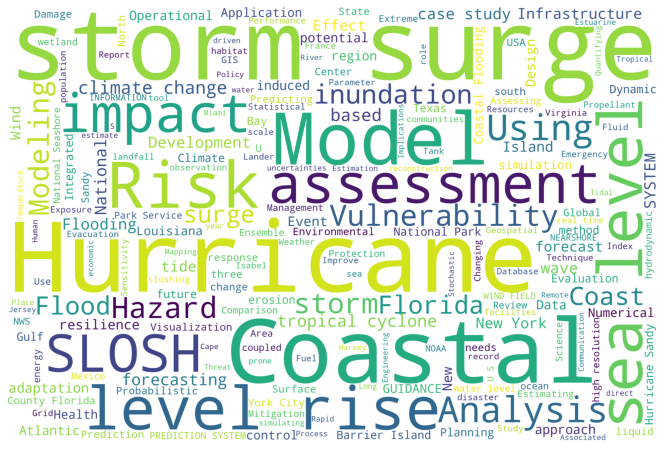

Wordcloud for publications mentioning Coastal Change Analysis Program :


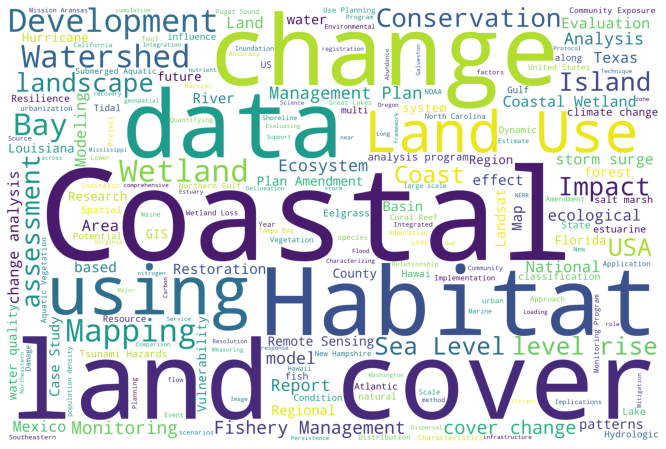

Wordcloud for publications mentioning Aging Integrated Database (AGID) :


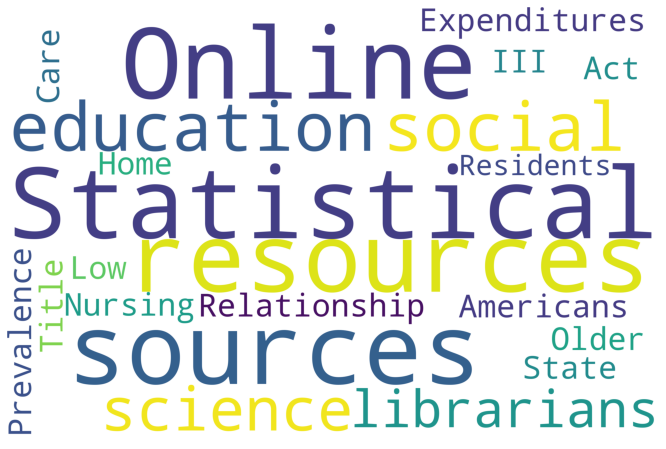

Wordcloud for publications mentioning Alzheimer's Disease Neuroimaging Initiative (ADNI) :


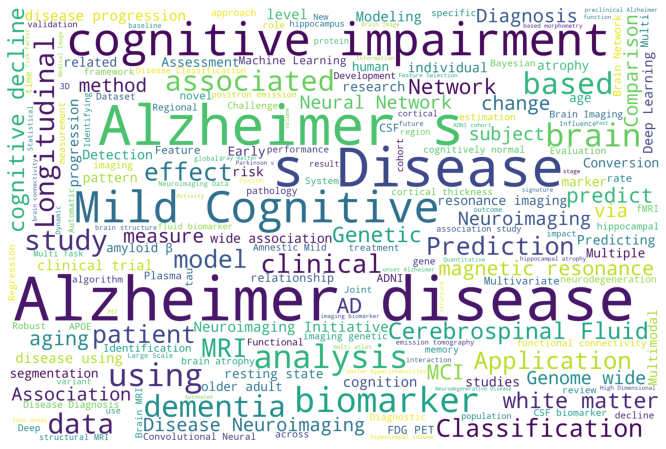

Wordcloud for publications mentioning Baltimore Longitudinal Study of Aging (BLSA) :


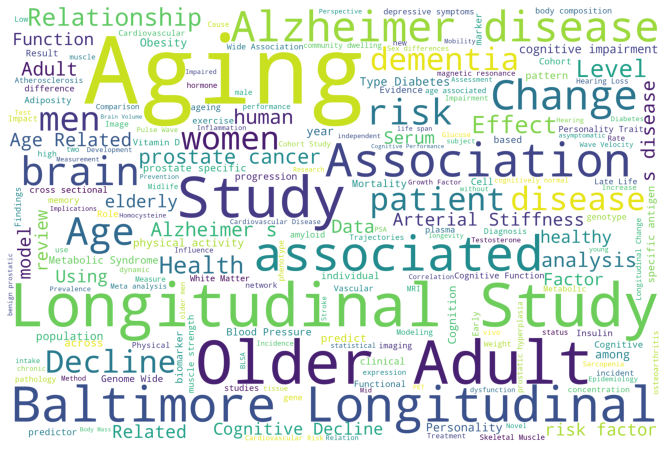

Wordcloud for publications mentioning Agricultural Resource Management Survey :


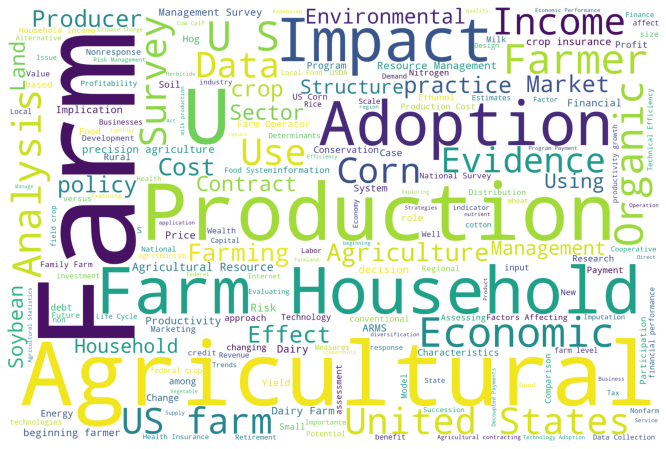

Wordcloud for publications mentioning Beginning Postsecondary Student :


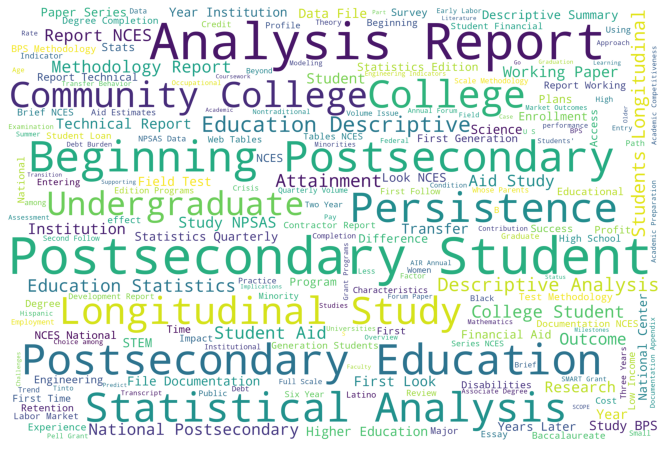

Wordcloud for publications mentioning The National Institute on Aging Genetics of Alzheimer's Disease Data Storage Site (NIAGADS) :


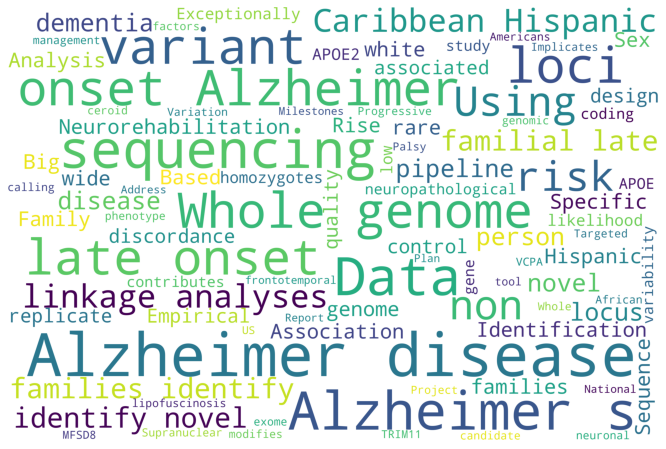

Wordcloud for publications mentioning Common Core of Data :


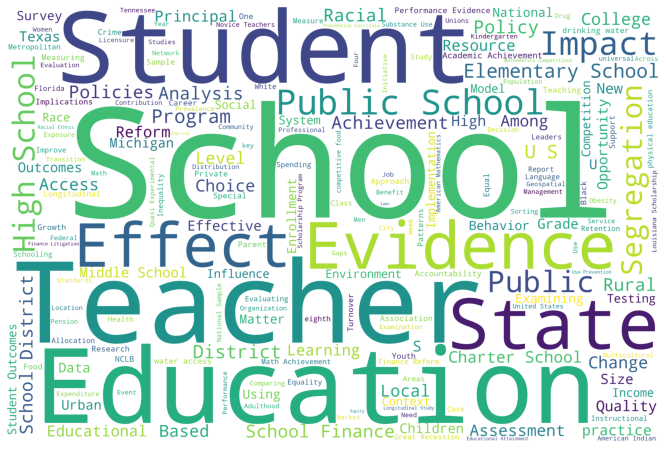

Wordcloud for publications mentioning Survey of Industrial Research and Development :


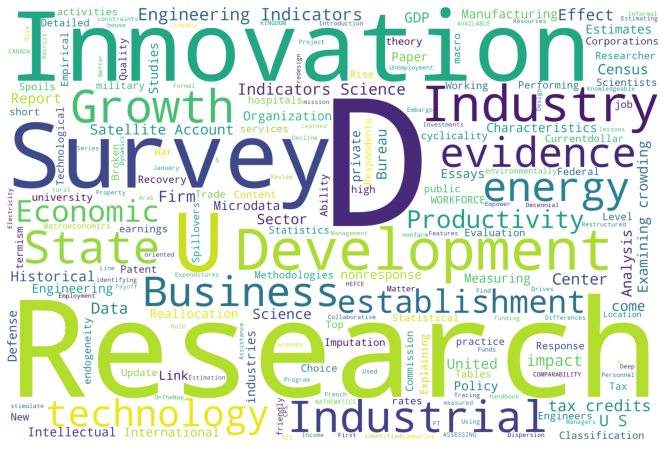

Wordcloud for publications mentioning Baccalaureate and Beyond :


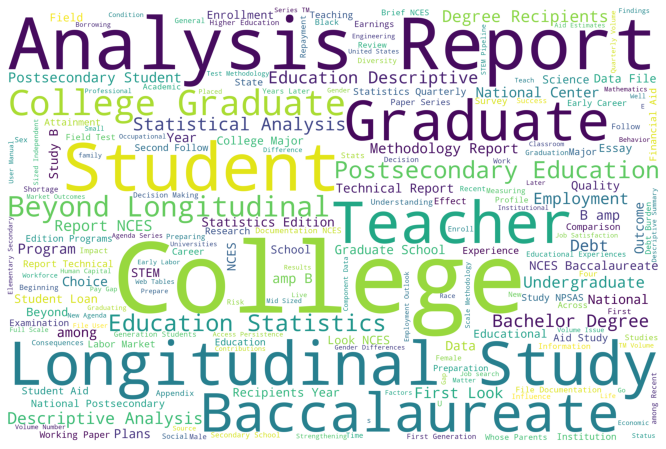

Wordcloud for publications mentioning International Best Track Archive for Climate Stewardship :


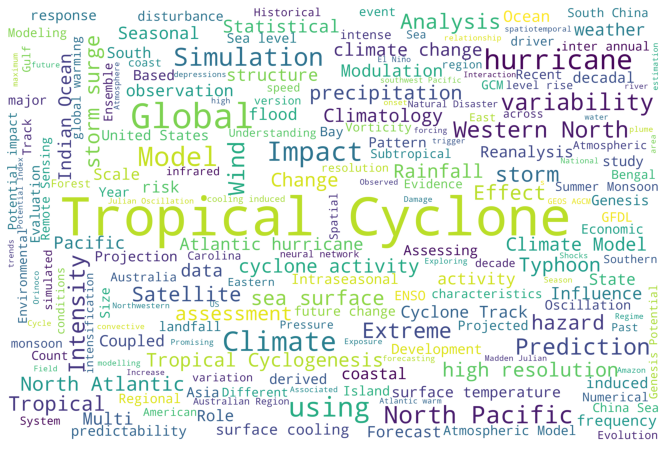

Wordcloud for publications mentioning National Teacher and Principal Survey :


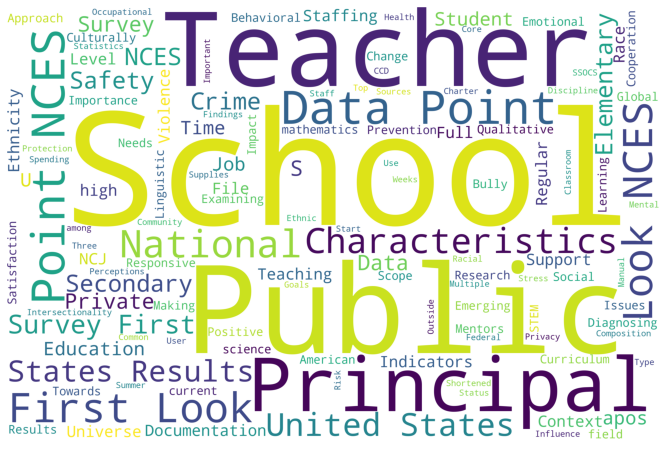

Wordcloud for publications mentioning Higher Education Research and Development Survey :


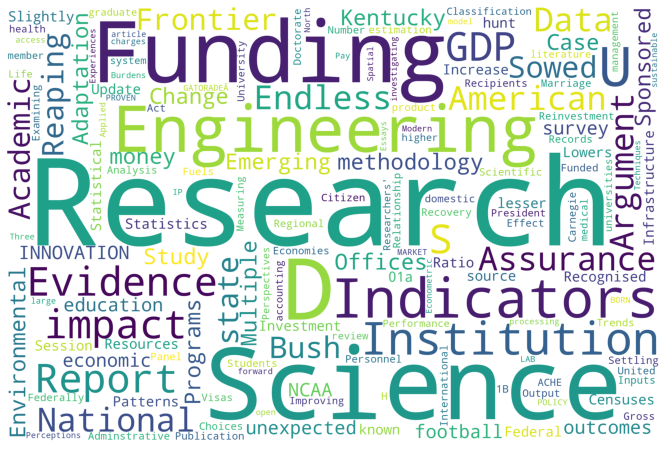

Wordcloud for publications mentioning Survey of Earned Doctorates :


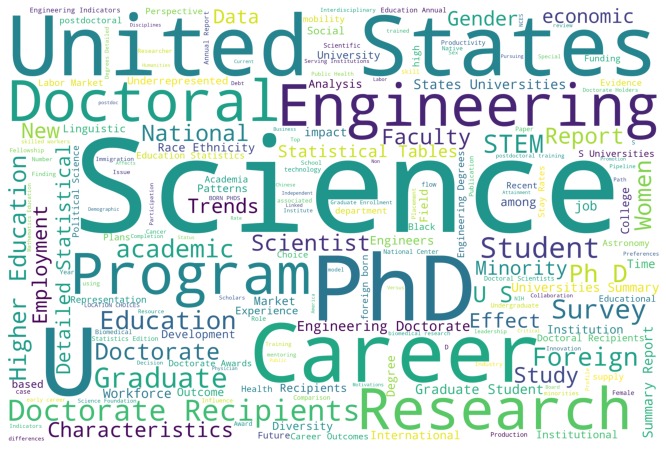

Wordcloud for publications mentioning School Survey on Crime and Safety :


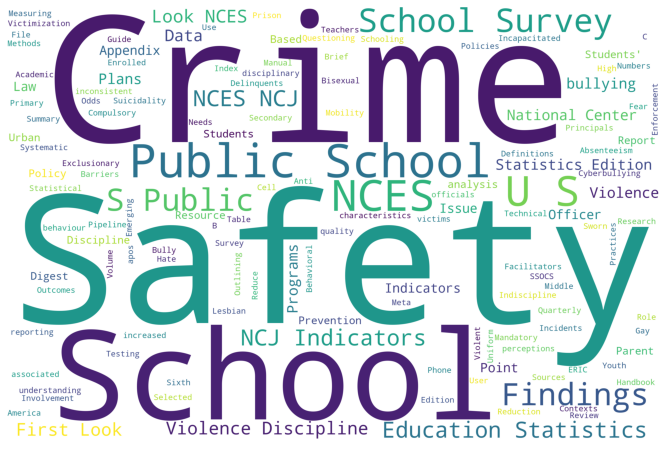

Wordcloud for publications mentioning World Ocean Database :


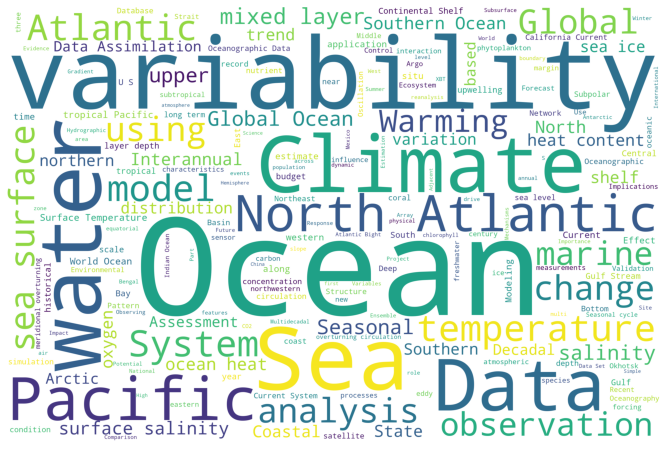

Wordcloud for publications mentioning Program for the International Assessment of Adult Competencies :


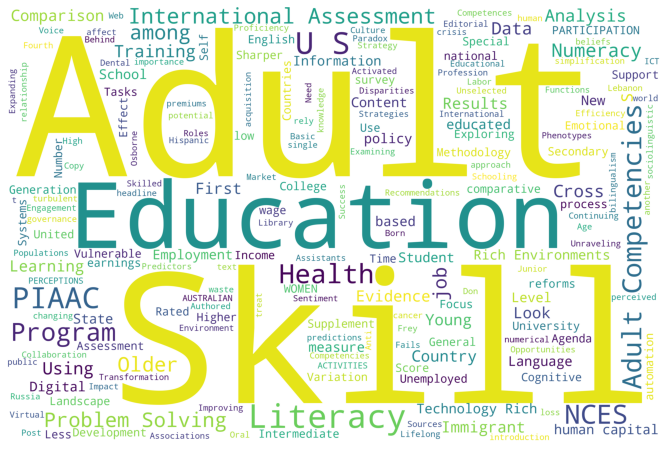

Wordcloud for publications mentioning Early Childhood Longitudinal Study :


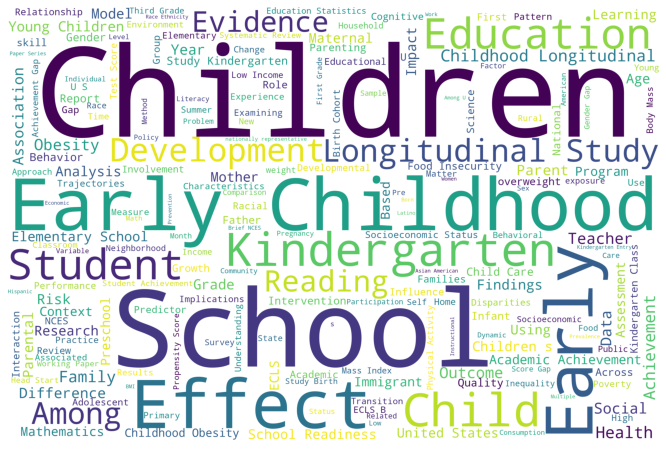

Wordcloud for publications mentioning Survey of Graduate Students and Postdoctorates in Science and Engineering :


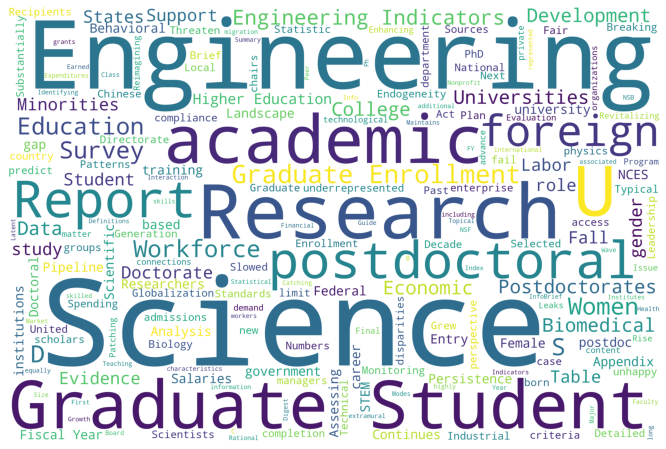

Wordcloud for publications mentioning Trends in International Mathematics and Science Study :


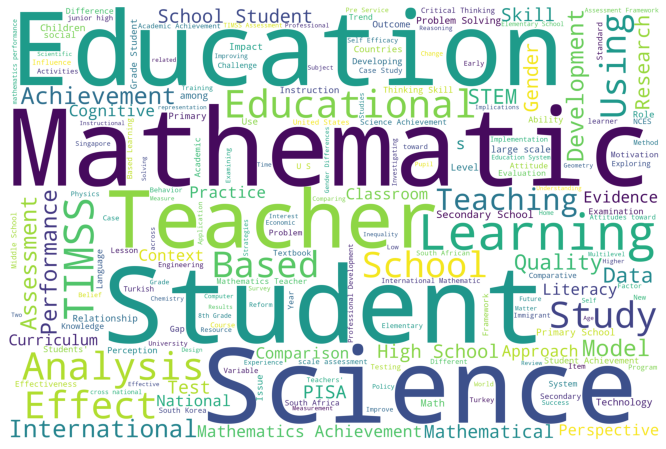

Wordcloud for publications mentioning Education Longitudinal Study :


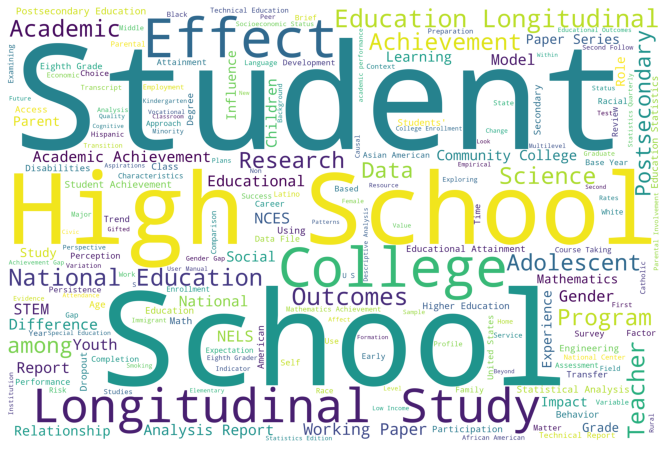

Wordcloud for publications mentioning Optimum Interpolation Sea Surface Temperature :


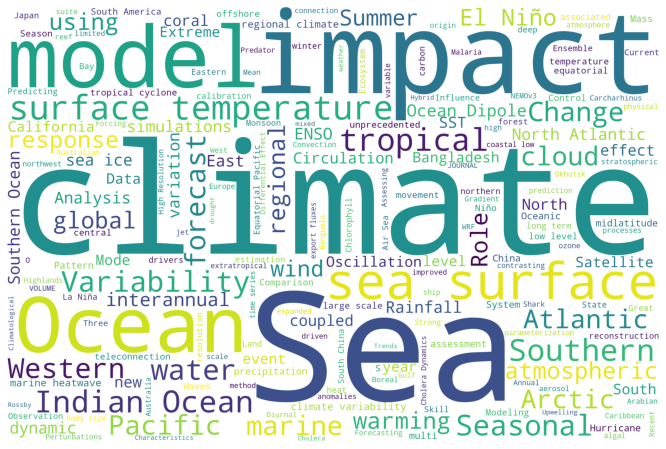

Wordcloud for publications mentioning National Assessment of Education Progress :


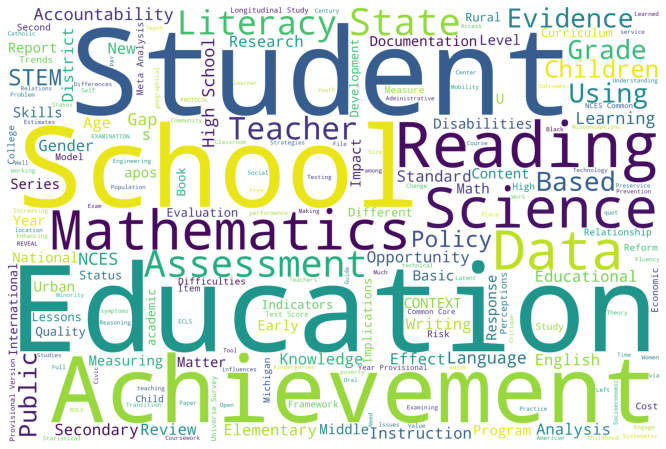

Wordcloud for publications mentioning High School Longitudinal Study :


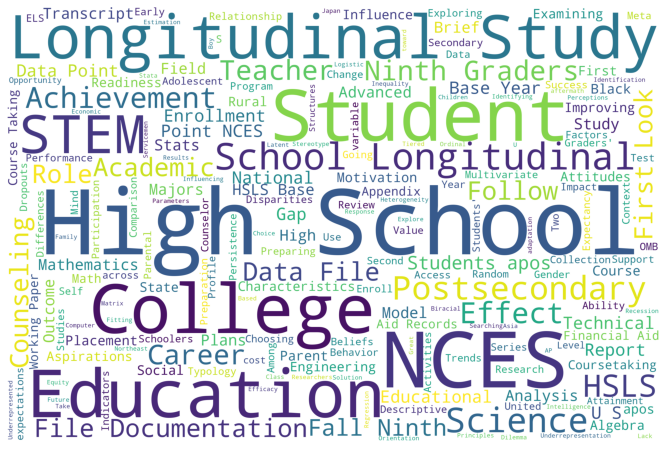

Wordcloud for publications mentioning Survey of Doctorate Recipients :


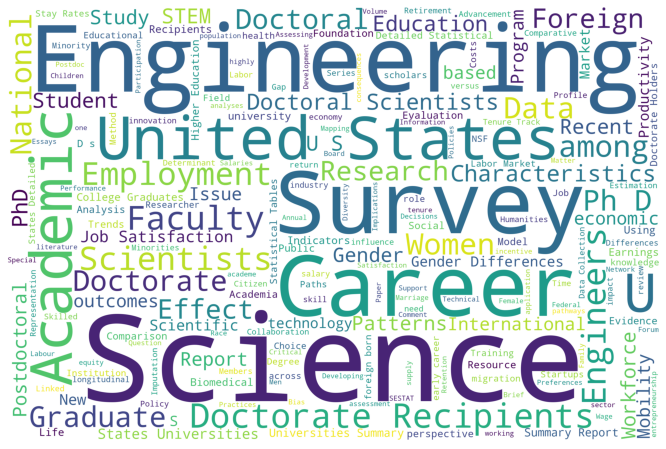

Wordcloud for publications mentioning Rural-Urban Continuum Codes :


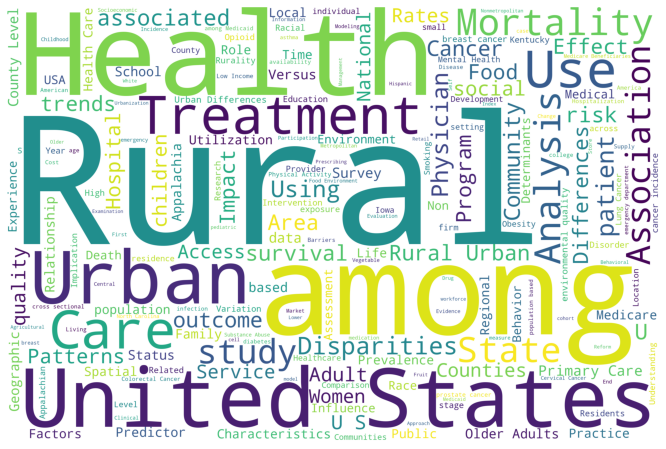

Wordcloud for publications mentioning Survey of Science and Engineering Research Facilities :


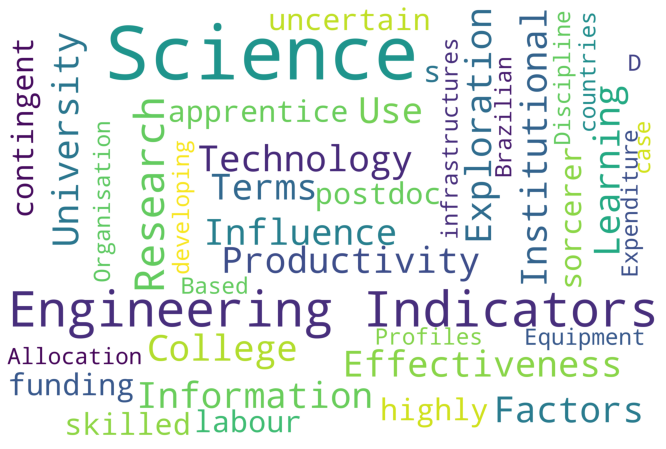

Wordcloud for publications mentioning FFRDC Research and Development Survey :


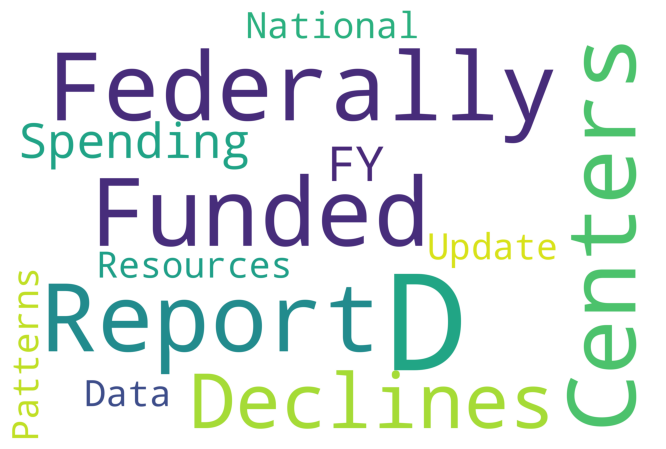

Wordcloud for publications mentioning Survey of State Government Research and Development :


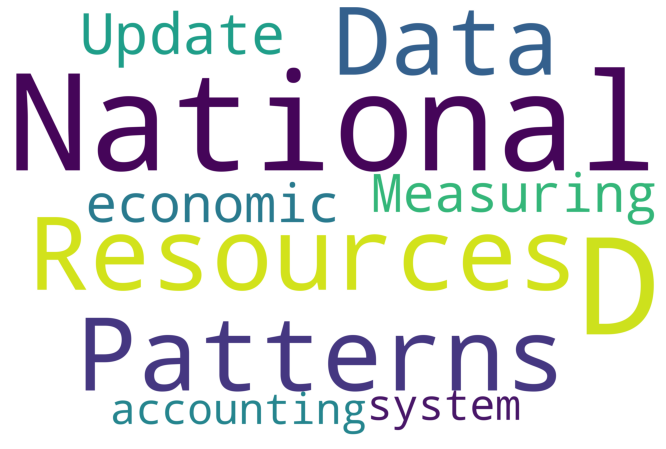

Wordcloud for publications mentioning Advanced National Seismic System (ANSS) Comprehensive Catalog (ComCat) :


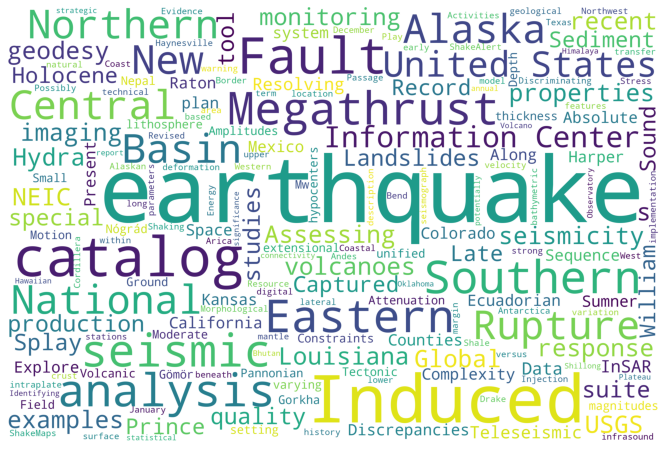

Wordcloud for publications mentioning Census of Agriculture :


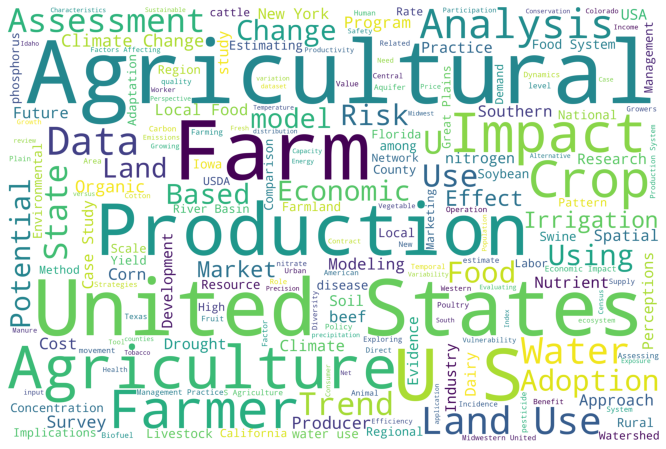

Wordcloud for publications mentioning North American Breeding Bird Survey (BBS) :


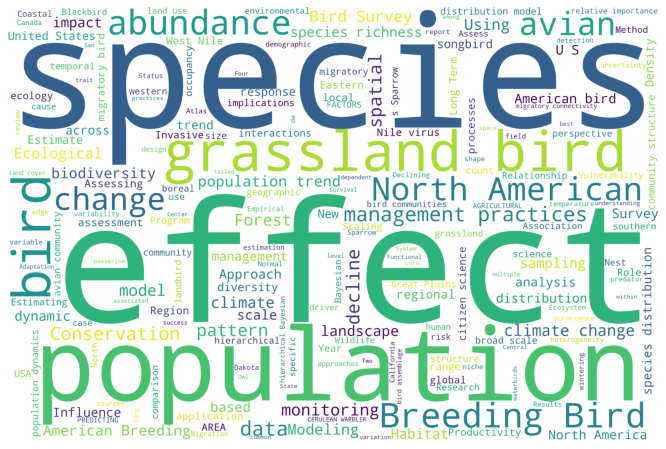

Wordcloud for publications mentioning COVID-19 Open Research Dataset (CORD-19) :


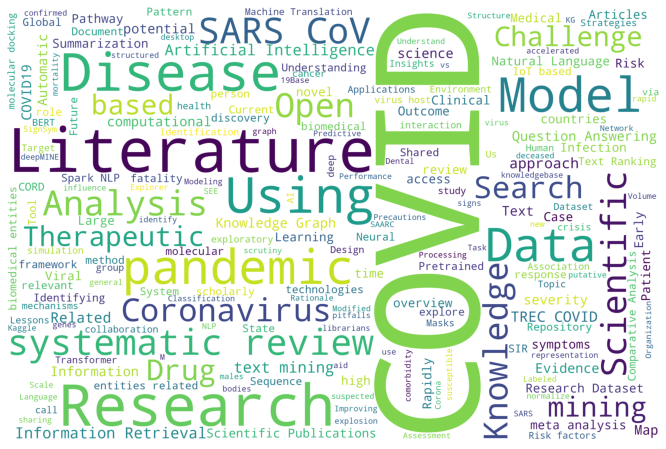

Wordcloud for publications mentioning Complexity Science Hub COVID-19 Control Strategies List (CCCSL) :


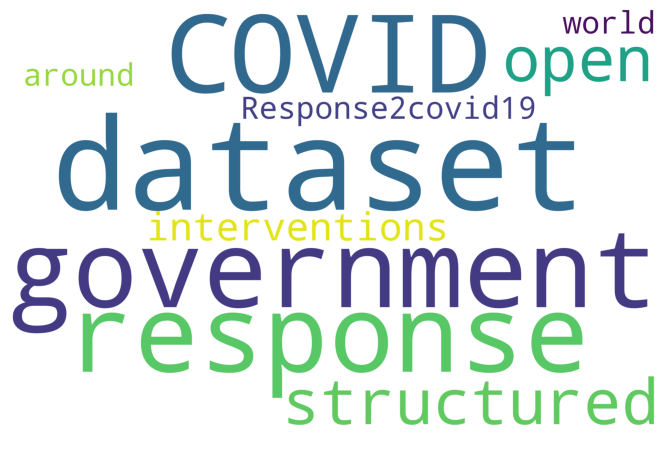

Wordcloud for publications mentioning Our World in Data COVID-19 dataset :


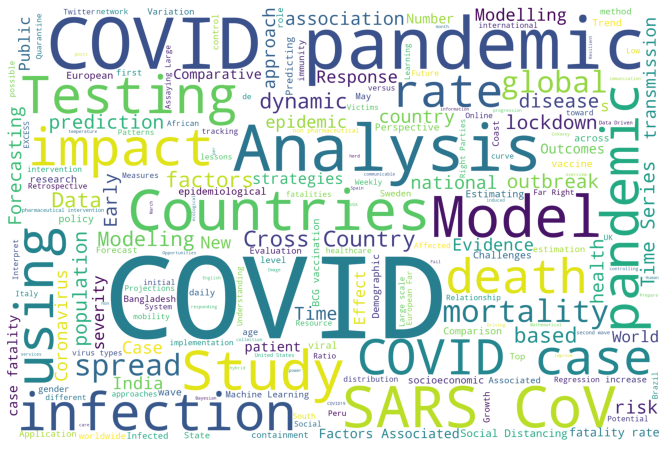

Wordcloud for publications mentioning COVID-19 Precision Medicine Analytics Platform Registry (JH-CROWN) :


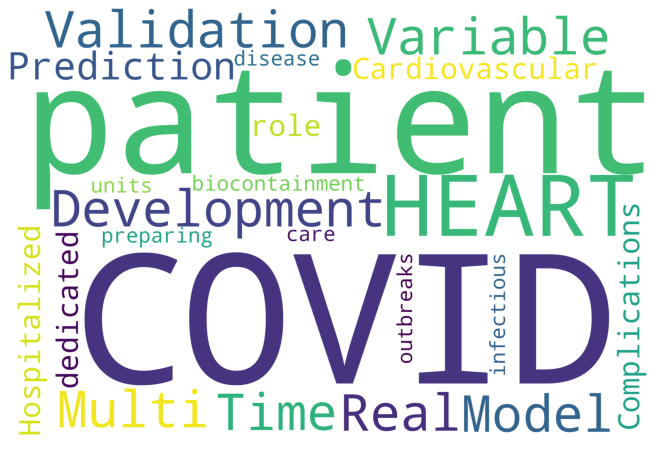

Wordcloud for publications mentioning Characterizing Health Associated Risks, and Your Baseline Disease In SARS-COV-2 (CHARYBDIS) :


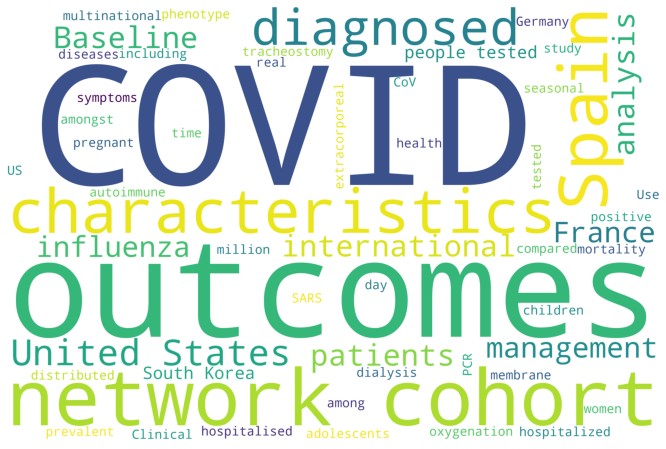

Wordcloud for publications mentioning COVID-19 Deaths data :


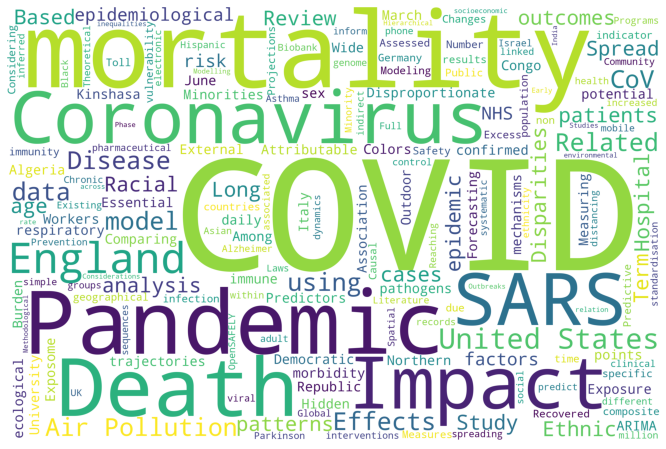

Wordcloud for publications mentioning SARS-CoV-2 genome sequence :


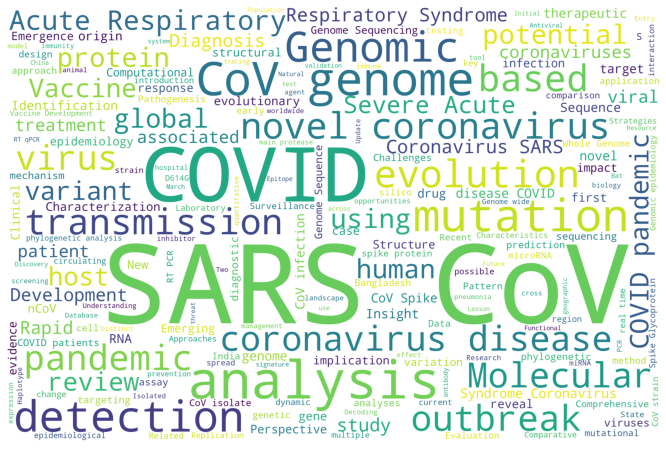

Wordcloud for publications mentioning COVID-19 Image Data Collection :


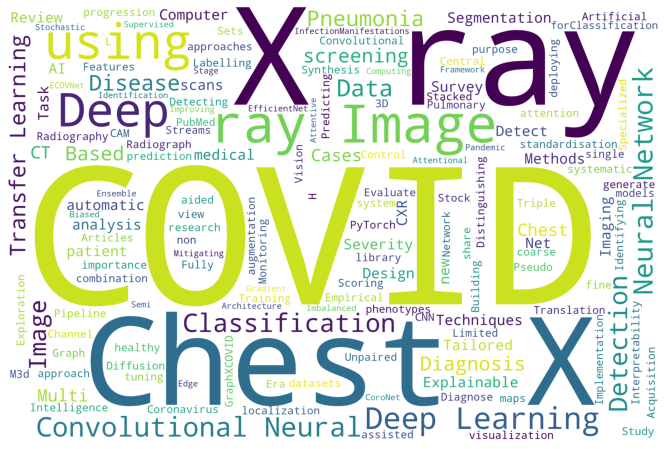

Wordcloud for publications mentioning RSNA International COVID-19 Open Radiology Database (RICORD) :


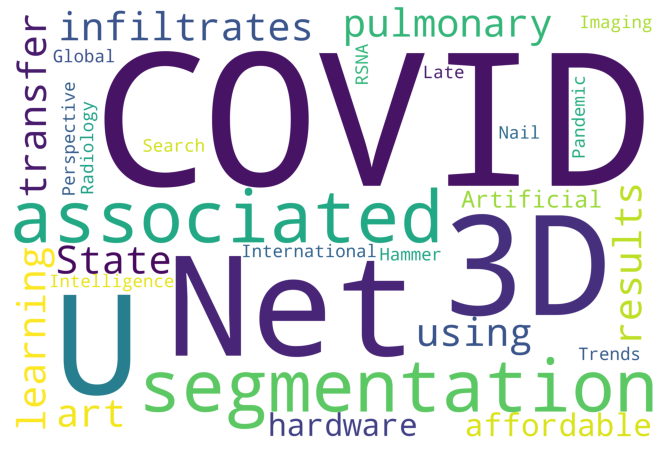

Wordcloud for publications mentioning CAS COVID-19 antiviral candidate compounds dataset :


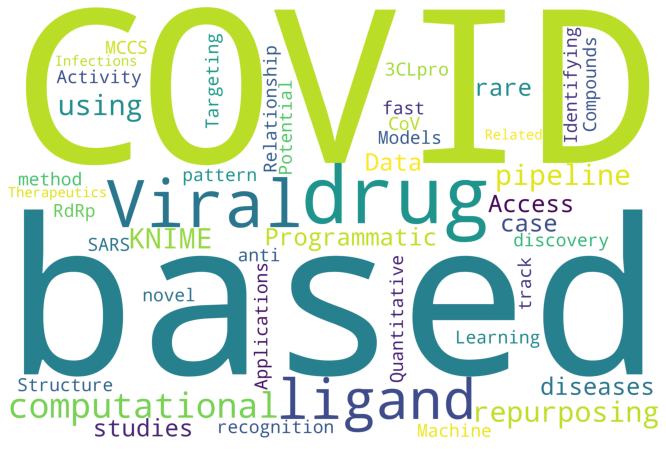

In [28]:
words_in_titles_by_dataset = defaultdict(list)

for _, row in train.iterrows():    #通常行ごとの処理ならiterrows関数を、列ごとの処理ならiteritems関数をジェネレーターとして使う
    words_in_titles_by_dataset[row['dataset_title']].extend(row['pub_title'].split())  #末尾に別のリストやタプルを結合（連結）: extend()
    
def wordcloud_draw(data, color = 'white'):
    wordcloud = WordCloud(stopwords = STOPWORDS,
                          background_color = color,
                          width = 3000,
                          height = 2000
                         ).generate(' '.join(data))
    plt.figure(1, figsize = (12, 8))
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.show()
    
for dataset_title in train['dataset_title'].unique():
    print("Wordcloud for publications mentioning", dataset_title, ":")
    wordcloud_draw(words_in_titles_by_dataset[dataset_title])

In [ ]:
# 3. Loading JSON Contents into a Pandas DataFrame 

In [ ]:
"""
# Gathering the files paths
train_files = glob.glob("../input/coleridgeinitiative-show-us-the-data/train/*.json")
test_files = glob.glob("../input/coleridgeinitiative-show-us-the-data/test/*.json")
"""

In [35]:
train_files = glob.glob(DATA_PATH + 'train\\*.json')   ##引数に指定されたパターンにマッチするファイルパス名を取得
test_files = glob.glob(DATA_PATH + 'test\\*.json')

In [ ]:
"""
# Generate the training publications dataframe
df_train_publications = pd.DataFrame()

for train_file in train_files:
    file_data = pd.read_json(train_file)
    file_data.insert(0,'pub_id', train_file.split('/')[-1].split('.')[0])
    df_train_publications = pd.concat([df_train_publications, file_data])

df_train_publications.to_csv("df_train_publications.csv",index=False)

df_train_publications
"""

In [45]:
df_train_publications = pd.DataFrame()

for train_file in train_files:
    file_data = pd.read_json(train_file)
    file_data.insert(0, 'pub_id', train_file.split('\\')[-1].split('.')[0])    #insert()で、指定した位置に要素を追加（挿入）:第一引数に位置、第二引数に挿入する要素を指定
    df_train_publications = pd.concat([df_train_publications, file_data])
    
df_train_publications.to_csv('df_train_publications.csv', index=False)

df_train_publications

,pub_id,section_title,text
0,0007f880-0a9b-492d-9a58-76eb0b0e0bd7,Abstract,The aim of this study was to identify if acqui...
1,0007f880-0a9b-492d-9a58-76eb0b0e0bd7,Introduction,The spur of ICT (Information and Communication...
2,0007f880-0a9b-492d-9a58-76eb0b0e0bd7,English and ICT,Studies continue to show that primary language...
3,0007f880-0a9b-492d-9a58-76eb0b0e0bd7,Lebanon,Lebanon is a small country situated in the Mid...
4,0007f880-0a9b-492d-9a58-76eb0b0e0bd7,Gender Inequality in Lebanon,Lebanese women are in a constant battle with a...
...,...,...,...
11,ffeb3568-7aed-4dbe-b177-cbd7f46f34af,The role of the status of mathematics,The factor that distinguishes mathematics from...
12,ffeb3568-7aed-4dbe-b177-cbd7f46f34af,Trampoline or self-fulfilling prophecy?,Abandoning mathematics can be a rational strat...
13,ffeb3568-7aed-4dbe-b177-cbd7f46f34af,Summary,The aim of this article was to reconstruct the...
14,ffeb3568-7aed-4dbe-b177-cbd7f46f34af,Literature,


In [47]:
file_data

,pub_id,section_title,text
0,ffee2676-a778-4521-b947-e1e420b126c5,,predicts that tuition and fees at four-year pu...


In [46]:
train_file.split('\\')[-1].split('.')[0]

'ffee2676-a778-4521-b947-e1e420b126c5'

In [48]:
train_file.split('\\')[-1]

'ffee2676-a778-4521-b947-e1e420b126c5.json'

In [49]:
train_file

'C:\\Users\\shota\\OneDrive\\ドキュメント\\Data\\Kaggle\\kc_Coleridge_Initiative-ShowUS_theData\\train\\ffee2676-a778-4521-b947-e1e420b126c5.json'

In [ ]:
"""
# Generate the testing publications dataframe
df_test_publications = pd.DataFrame()

for test_file in test_files:
    file_data = pd.read_json(test_file)
    file_data.insert(0,'pub_id', test_file.split('/')[-1].split('.')[0])
    df_test_publications = pd.concat([df_test_publications, file_data])

df_test_publications.to_csv("df_test_publications.csv",index=False)

df_test_publications
"""

In [50]:
df_test_publications = pd.DataFrame()

for test_file in test_files:
    file_data = pd.read_json(test_file)
    file_data.insert(0,'pub_id', test_file.split('\\')[-1].split('.')[0])
    df_test_publications = pd.concat([df_test_publications, file_data])
    
df_test_publications.to_csv('df_test_publications.csv', index=False)

df_test_publications

,pub_id,section_title,text
0,2100032a-7c33-4bff-97ef-690822c43466,Abstract,Cognitive deficits and reduced educational ach...
1,2100032a-7c33-4bff-97ef-690822c43466,Introduction,A general cognitive ability factor (also terme...
2,2100032a-7c33-4bff-97ef-690822c43466,Methods and Materials,COGENT is an international GWAS collaboration ...
3,2100032a-7c33-4bff-97ef-690822c43466,2011) Plink was used to analyze datasets compr...,", and GCTA used to analyze five datasets in wh..."
4,2100032a-7c33-4bff-97ef-690822c43466,Results,
...,...,...,...
12,8e6996b4-ca08-4c0b-bed2-aaf07a4c6a60,Discussion,"In this section, we highlight the points of co..."
13,8e6996b4-ca08-4c0b-bed2-aaf07a4c6a60,8,Anne Palmer et al. A+ or − indicates that th...
14,8e6996b4-ca08-4c0b-bed2-aaf07a4c6a60,10,Anne Palmer et al. While convenience and dolla...
15,8e6996b4-ca08-4c0b-bed2-aaf07a4c6a60,Limitations,The key variables in this study are measured i...


In [ ]:
# 4. A Naïve Dataset Title Matching Submission

In [ ]:
"""
def clean_text(txt):
    return re.sub('[^A-Za-z0-9]+', ' ', str(txt).lower()).strip()
"""

In [56]:
def clean_text(txt):
    return re.sub('[^A-Za-z0-9]+', ' ', str(txt).lower().strip())  #re.sub()では第一引数に正規表現パターン、第二引数に置換先文字列、第三引数に処理対象の文字列を指定
                                                      #strip():両端にある特定の文字列や空白文字を削除するメソッド

In [ ]:
"""
submission_df = pd.read_csv('../input/coleridgeinitiative-show-us-the-data/sample_submission.csv', index_col=0)
"""

In [51]:
submission_df = pd.read_csv(DATA_PATH + 'sample_submission.csv', index_col=0)  #index_col=0は、インデックスの列名。 0を指定すると、最初の列がインデックスとなります

In [52]:
submission_df

,PredictionString
Id,
2100032a-7c33-4bff-97ef-690822c43466,NaN
2f392438-e215-4169-bebf-21ac4ff253e1,NaN
3f316b38-1a24-45a9-8d8c-4e05a42257c6,NaN
8e6996b4-ca08-4c0b-bed2-aaf07a4c6a60,NaN


In [ ]:
"""
submission_df = pd.read_csv('../input/coleridgeinitiative-show-us-the-data/sample_submission.csv', index_col=0)
datasets_titles = [x.lower() for x in set(train['dataset_title'].unique()).union(set(train['dataset_label'].unique()))]

labels = []
for index in submission_df.index:
    publication_text = df_test_publications[df_test_publications['pub_id'] == index].text.str.cat(sep='\n').lower()
    label = []
    for dataset_title in datasets_titles:
        if dataset_title in publication_text:
            label.append(clean_text(dataset_title))
    labels.append('|'.join(label))

submission_df['PredictionString'] = labels

submission_df.to_csv('submission.csv')

submission_df
"""

In [57]:
datasets_titles = [x.lower() for x in set(train['dataset_title'].unique()).union(set(train['dataset_label'].unique()))]

labels = []
for index in submission_df.index:                                     #要素に対して「text」を実行することで要素のinnerTextを取得
    publication_text = df_test_publications[df_test_publications['pub_id'] == index].text.str.cat(sep='\n').lower() 
    label = []                                                                         #str.cat()で文字列の連結, sepに文字列を指定すると間に挿入される
    for dataset_title in datasets_titles:
        if dataset_title in publication_text:
            label.append(clean_text(dataset_title))
    labels.append('|'.join(label))      #join は　連結させるためのメソッド

submission_df['PredictionString'] = labels

submission_df.to_csv('kc_Coleridge_submission.csv')

submission_df

,PredictionString
Id,
2100032a-7c33-4bff-97ef-690822c43466,alzheimer s disease neuroimaging initiative ad...
2f392438-e215-4169-bebf-21ac4ff253e1,common core of data|nces common core of data|t...
3f316b38-1a24-45a9-8d8c-4e05a42257c6,noaa storm surge inundation|slosh model|sea la...
8e6996b4-ca08-4c0b-bed2-aaf07a4c6a60,rural urban continuum codes


In [ ]:
# str.cat() 例
"""
print(df['name'].str.cat(df['state'], sep=' in '))
# 0      Alice in NY
# 1        Bob in CA
# 2    Charlie in CA
# Name: name, dtype: object
"""

In [ ]:
# set型とunion
# set型:リストとは異なり要素は順番をもちません。また、重複した要素は取り除かれます。
# union():和集合
"""
unionの例
set0 = set() 
set1 = {'python', 'java', 'c#'}
set2 = {'java', 'ruby'}
set3 = {'php', 'python'}

set0.union(set1, set2, set3)
#[結果] {'java', 'c#', 'ruby', 'python', 'php'}
"""

In [ ]:
# joinメソッド
"""
join 例
test = ['ab', 'c', 'de']
result = ''.join(test)
print(result)
結果:abcde

test = ['ab', 'c', 'de']
result = ','.join(test)
print(result)
結果:ab,c,de
"""